# **Importing Libraries**


In [1]:
import numpy as np
import pandas as pd
from copy import deepcopy
import sys

import mplsoccer
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
from matplotlib.patches import Arc
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.projections import get_projection_class
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Load the data

In [2]:
eventsDataLaLiga2019 = pd.read_csv("D:\Analytics\Football\MAS - Masterclass\Data\matchwise_events_data_updated.csv", low_memory=False)

In [3]:
pd.set_option('display.max_rows',100)
pd.set_option('display.max_columns',50)

# Data Prep 

## Observations and Columns for Analysing Attackers

Four types of events to consider to obtain and prepare attacking data: <br>

1. Shots <br>
2. Carries : In Final 3rd <br>
3. Dribbles: In Final 3rd <br>
4. Assists (Both Shot and Goal)

### Filtering based on position

In [4]:
eventsDataLaLiga2019[['position.id','position.name']].drop_duplicates().sort_values('position.id')

,position.id,position.name
33178,0.0,Substitute
54,1.0,Goalkeeper
40,2.0,Right Back
22,3.0,Right Center Back
8169,4.0,Center Back
7,5.0,Left Center Back
30,6.0,Left Back
8051,7.0,Right Wing Back
7978,8.0,Left Wing Back
4027,9.0,Right Defensive Midfield


In [5]:
eventsFwdData = eventsDataLaLiga2019[eventsDataLaLiga2019['position.id']>16]

In [6]:
eventsFwdData.shape

(29590, 155)

### Shot Columns

In [7]:
eventsFwdData.columns[eventsFwdData.columns.str.startswith('shot')]

Index(['shot.statsbomb_xg', 'shot.end_location', 'shot.key_pass_id',
       'shot.technique.id', 'shot.technique.name', 'shot.body_part.id',
       'shot.body_part.name', 'shot.type.id', 'shot.type.name',
       'shot.outcome.id', 'shot.outcome.name', 'shot.freeze_frame',
       'shot.first_time', 'shot.one_on_one', 'shot.redirect',
       'shot.aerial_won', 'shot.open_goal', 'shot.saved_to_post',
       'shot.deflected', 'shot.saved_off_target'],
      dtype='object')

In [8]:
shotCols = eventsFwdData.columns[eventsFwdData.columns.str.startswith('shot')]

### Additional Columns

In [9]:
shotAdditionalCols = ['match_id','id',
                      'timestamp','minute','second',
                      'type.id','type.name',
                      'possession_team.id','possession_team.name',
                      'play_pattern.id','play_pattern.name',
                      'team.id','team.name',
                      'player.id','jersey_number','player.name',
                      'position.id','position.name',
                      'under_pressure',
                      'location',
                      'started','minsPlayed']

In [10]:
shotCols = shotCols.tolist()
shotCols = shotAdditionalCols + shotCols
shotCols

['match_id',
 'id',
 'timestamp',
 'minute',
 'second',
 'type.id',
 'type.name',
 'possession_team.id',
 'possession_team.name',
 'play_pattern.id',
 'play_pattern.name',
 'team.id',
 'team.name',
 'player.id',
 'jersey_number',
 'player.name',
 'position.id',
 'position.name',
 'under_pressure',
 'location',
 'started',
 'minsPlayed',
 'shot.statsbomb_xg',
 'shot.end_location',
 'shot.key_pass_id',
 'shot.technique.id',
 'shot.technique.name',
 'shot.body_part.id',
 'shot.body_part.name',
 'shot.type.id',
 'shot.type.name',
 'shot.outcome.id',
 'shot.outcome.name',
 'shot.freeze_frame',
 'shot.first_time',
 'shot.one_on_one',
 'shot.redirect',
 'shot.aerial_won',
 'shot.open_goal',
 'shot.saved_to_post',
 'shot.deflected',
 'shot.saved_off_target']

### Additional Attacker Metric Columns

In [11]:
eventsFwdData.columns.values

array(['match_id', 'id', 'index', 'period', 'timestamp', 'minute',
       'second', 'possession', 'duration', 'type.id', 'type.name',
       'possession_team.id', 'possession_team.name', 'play_pattern.id',
       'play_pattern.name', 'team.id', 'team.name', 'tactics.formation',
       'tactics.lineup', 'related_events', 'off_camera', 'location',
       'player.id', 'player.name', 'position.id', 'position.name',
       'pass.recipient.id', 'pass.recipient.name', 'pass.length',
       'pass.angle', 'pass.height.id', 'pass.height.name',
       'pass.end_location', 'pass.body_part.id', 'pass.body_part.name',
       'pass.type.id', 'pass.type.name', 'carry.end_location',
       'under_pressure', 'dribble.outcome.id', 'dribble.outcome.name',
       'dribble.nutmeg', 'duel.type.id', 'duel.type.name',
       'duel.outcome.id', 'duel.outcome.name', 'pass.outcome.id',
       'pass.outcome.name', 'ball_receipt.outcome.id',
       'ball_receipt.outcome.name', 'counterpress',
       'ball_recovery.

In [12]:
eventsFwdData[eventsFwdData['type.id'] == 43]['carry.end_location'].isnull().sum()

0

In [13]:
eventsFwdData[eventsFwdData['type.id'] == 14]['dribble.outcome.name'].unique()

array(['Complete', 'Incomplete'], dtype=object)

In [14]:
eventsFwdData[eventsFwdData['type.id'] == 4]['duel.type.name'].unique()

array(['Aerial Lost', 'Tackle'], dtype=object)

In [15]:
AdditionalCols = ['pass.shot_assist','pass.goal_assist',
                  'carry.end_location','dribble.outcome.id',
                  'dribble.outcome.name']

Extracting the co-ordinates from locations

In [16]:
# Start location for all actions
eventsFwdData['startX'] = eventsFwdData['location'].str.split(', ',expand=True)[0].str[1:].apply(pd.to_numeric)
eventsFwdData['startY'] = eventsFwdData['location'].str.split(', ',expand=True)[1].str[:-1].apply(pd.to_numeric)

#End location for carries
eventsFwdData['endXCarry'] = eventsFwdData['carry.end_location'].str.split(', ',expand=True)[0].str[1:].apply(pd.to_numeric)
eventsFwdData['endYCarry'] = eventsFwdData['carry.end_location'].str.split(', ',expand=True)[1].str[:-1].apply(pd.to_numeric)

#End location for shots
eventsFwdData['endXShot'] = eventsFwdData['shot.end_location'].str.split(', ',expand=True)[0].str[1:].apply(pd.to_numeric)
eventsFwdData['endYShot'] = eventsFwdData['shot.end_location'].str.split(', ',expand=True)[1].str.replace(']','').apply(pd.to_numeric)
eventsFwdData['goalHeight'] = eventsFwdData['shot.end_location'].str.split(', ',expand=True)[2].str[:-1].apply(pd.to_numeric)

<ipython-input-16-a8453557a37e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eventsFwdData['startX'] = eventsFwdData['location'].str.split(', ',expand=True)[0].str[1:].apply(pd.to_numeric)
<ipython-input-16-a8453557a37e>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eventsFwdData['startY'] = eventsFwdData['location'].str.split(', ',expand=True)[1].str[:-1].apply(pd.to_numeric)
<ipython-input-16-a8453557a37e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

In [17]:
AdditionalCols = AdditionalCols + ['startX','startY','endXCarry','endYCarry','endXShot','endYShot','goalHeight']

#### Shots

In [18]:
eventsFwdData[eventsFwdData['type.id']==16]['type.name'].unique()

array(['Shot'], dtype=object)

In [19]:
shotData = deepcopy(eventsFwdData[eventsFwdData['type.id']==16])

#### Carries: In Final 3rd

In [20]:
eventsFwdData[(eventsFwdData['type.id']==43) & (eventsFwdData['startX']>80)]['type.name'].unique()

array(['Carry'], dtype=object)

In [21]:
carryData = deepcopy(eventsFwdData[(eventsFwdData['type.id']==43) & (eventsFwdData['startX']>80)])

#### Dribbles: In Final 3rd

In [22]:
dribbleData = deepcopy(eventsFwdData[(eventsFwdData['type.id']==14) & (eventsFwdData['startX']>80)])

#### Shot and Goal Assists

In [23]:
assistData = deepcopy(eventsFwdData[(eventsFwdData['pass.shot_assist']) | (eventsFwdData['pass.goal_assist'])])

## Total Event Data for Analysing Attackers

In [24]:
pd.concat([shotData,carryData,dribbleData,assistData])

,match_id,id,index,period,timestamp,minute,second,possession,duration,type.id,type.name,possession_team.id,possession_team.name,play_pattern.id,play_pattern.name,team.id,team.name,tactics.formation,tactics.lineup,related_events,off_camera,location,player.id,player.name,position.id,...,dribble.no_touch,goalkeeper.success_in_play,goalkeeper.lost_in_play,match_date,kick_off,home_score,away_score,home_team.home_team_id,home_team.home_team_name,away_team.away_team_id,away_team.away_team_name,jersey_number,started,subID,minMinute,maxMinute,maxMinsMatch,minsPlayed,startX,startY,endXCarry,endYCarry,endXShot,endYShot,goalHeight
471,303421,0d426501-d17e-4dd8-abd0-e3f039a1738e,472,1,09:00.4,9,0,14,1.425280,16,Shot,217,Barcelona,7,From Goal Kick,217,Barcelona,NaN,NaN,['4ce4e91f-a468-4ce1-a96b-9cb988ada664'],NaN,"[101.4, 28.0]",30756.0,Anssumane Fati,21.0,...,NaN,NaN,NaN,7/19/2020,00:00.0,0,5,206,Deportivo Alavés,217,Barcelona,31.0,Yes,NaN,0.0,77,94,77.0,101.4,28.0,NaN,NaN,120.0,45.4,0.7
759,303421,2c6cab4a-8c41-4356-a28e-2dc55efb10fa,760,1,15:16.5,15,16,28,0.936023,16,Shot,217,Barcelona,1,Regular Play,217,Barcelona,NaN,NaN,"['86816c9e-eb56-4bf4-b16f-b986554d064a', '96c9...",NaN,"[96.7, 43.2]",5503.0,Lionel Andrés Messi Cuccittini,17.0,...,NaN,NaN,NaN,7/19/2020,00:00.0,0,5,206,Deportivo Alavés,217,Barcelona,10.0,Yes,NaN,0.0,94,94,94.0,96.7,43.2,NaN,NaN,120.0,36.2,1.9
779,303421,2631da71-a158-4c7d-82ab-2425806763fd,780,1,16:07.9,16,7,30,0.503484,16,Shot,217,Barcelona,1,Regular Play,217,Barcelona,NaN,NaN,['90373e3d-1e80-4a41-8390-dfd8e7efe9f6'],NaN,"[106.6, 29.9]",5246.0,Luis Alberto Suárez Díaz,23.0,...,NaN,NaN,NaN,7/19/2020,00:00.0,0,5,206,Deportivo Alavés,217,Barcelona,9.0,Yes,NaN,0.0,94,94,94.0,106.6,29.9,NaN,NaN,118.2,37.2,1.2
940,303421,09dd70ba-bc95-413e-92e1-020d666fc6b0,941,1,20:42.4,20,42,38,1.338275,16,Shot,217,Barcelona,3,From Free Kick,217,Barcelona,NaN,NaN,['d806859f-46b8-4f3c-8f3d-1dfd1dab6fd3'],NaN,"[96.2, 49.5]",5503.0,Lionel Andrés Messi Cuccittini,17.0,...,NaN,NaN,NaN,7/19/2020,00:00.0,0,5,206,Deportivo Alavés,217,Barcelona,10.0,Yes,NaN,0.0,94,94,94.0,96.2,49.5,NaN,NaN,120.0,43.1,4.6
1069,303421,0d285dcc-7406-4f5a-a358-a24d69ab501a,1070,1,23:29.3,23,29,43,0.466431,16,Shot,217,Barcelona,4,From Throw In,217,Barcelona,NaN,NaN,['24ebb3a0-38c0-4010-b9d3-027069e20bde'],NaN,"[112.5, 42.7]",30756.0,Anssumane Fati,21.0,...,NaN,NaN,NaN,7/19/2020,00:00.0,0,5,206,Deportivo Alavés,217,Barcelona,31.0,Yes,NaN,0.0,77,94,77.0,112.5,42.7,NaN,NaN,120.0,43.1,0.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124239,303682,8e6ae556-3281-44a8-82a3-47189c129640,2893,2,20:54.4,65,54,131,1.210272,30,Pass,221,Levante,1,Regular Play,221,Levante,NaN,NaN,['e51cd7e7-0ada-49e3-9640-0b8e619ef7ad'],NaN,"[107.9, 59.2]",6684.0,Roger Martí Salvador,22.0,...,NaN,NaN,NaN,2/2/2020,00:00.0,2,1,217,Barcelona,221,Levante,9.0,Yes,NaN,0.0,94,94,94.0,107.9,59.2,NaN,NaN,NaN,NaN,NaN
125116,303682,3c750e29-09d3-4855-a093-2952feb2c5e3,3770,2,42:15.6,87,15,181,1.337030,30,Pass,217,Barcelona,7,From Goal Kick,217,Barcelona,NaN,NaN,"['5103b43d-ff9f-4b77-8651-6f20b8e0c8bb', 'b9f5...",NaN,"[79.0, 35.2]",5503.0,Lionel Andrés Messi Cuccittini,23.0,...,NaN,NaN,NaN,2/2/2020,00:00.0,2,1,217,Barcelona,221,Levante,10.0,Yes,NaN,0.0,94,94,94.0,79.0,35.2,NaN,NaN,NaN,NaN,NaN
125867,303731,9775a356-2281-43fd-af97-14ae1dc7ceb4,499,1,10:05.5,10,5,17,2.028036,30,Pass,322,Eibar,4,From Throw In,322,Eibar,NaN,NaN,['45f5f455-4de9-4ed6-af91-a243ed215503'],NaN,"[85.4, 26.8]",7105.0,Fabián Ariel Orellana Valenzuela,17.0,...,NaN,NaN,NaN,2/22/2020,00:00.0,5,0,217,Barcelona,322,Eibar,14.0,Yes,NaN,0.0,91,91,91.0,85.4,26.8,NaN,NaN,NaN,NaN,NaN
127228,303731,c914e441-616a-4142-806c-fa34b9f1e311,1860,1,42:53.6,42,53,82,0.782046,30,Pass,217,Barcelona,1,Regular Play,217,Barcelona,NaN,NaN,['4f94445d-ae2a-4a71-8788-4534c931cab6'],NaN,"[110.1, 24.9]",82

In [25]:
attEventData = pd.concat([shotData,carryData,dribbleData,assistData])

In [26]:
attEventData = attEventData.sort_values(['match_id','possession','minute','second'])

In [27]:
FinalCols = shotCols + AdditionalCols

In [28]:
attEventData[FinalCols]['type.name'].unique()

array(['Carry', 'Dribble', 'Shot', 'Pass'], dtype=object)

In [29]:
attEventData = attEventData[FinalCols]

In [30]:
attEventData.shape

(4090, 54)

# Exploring the Attacking Metrics

In [31]:
attEventData.head()

,match_id,id,timestamp,minute,second,type.id,type.name,possession_team.id,possession_team.name,play_pattern.id,play_pattern.name,team.id,team.name,player.id,jersey_number,player.name,position.id,position.name,under_pressure,location,started,minsPlayed,shot.statsbomb_xg,shot.end_location,shot.key_pass_id,...,shot.type.id,shot.type.name,shot.outcome.id,shot.outcome.name,shot.freeze_frame,shot.first_time,shot.one_on_one,shot.redirect,shot.aerial_won,shot.open_goal,shot.saved_to_post,shot.deflected,shot.saved_off_target,pass.shot_assist,pass.goal_assist,carry.end_location,dribble.outcome.id,dribble.outcome.name,startX,startY,endXCarry,endYCarry,endXShot,endYShot,goalHeight
106117,303377,ff6d1b0e-01be-4db4-a9fd-c94eb4dd8526,01:38.1,1,38,43,Carry,216,Getafe,1,Regular Play,216,Getafe,11550.0,7.0,Jaime Mata Arnaiz,24.0,Left Center Forward,NaN,"[89.2, 34.5]",Yes,93.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[90.4, 35.3]",NaN,NaN,89.2,34.5,90.4,35.3,NaN,NaN,NaN
106126,303377,e30197bb-b47a-4a4c-9f5a-a54a17f5c7b7,01:44.3,1,44,43,Carry,216,Getafe,1,Regular Play,216,Getafe,11550.0,7.0,Jaime Mata Arnaiz,24.0,Left Center Forward,True,"[115.9, 21.0]",Yes,93.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[119.1, 18.8]",NaN,NaN,115.9,21.0,119.1,18.8,NaN,NaN,NaN
106194,303377,9c9c5bda-6fd8-4733-803a-18257c5526ea,03:50.9,3,50,43,Carry,216,Getafe,4,From Throw In,216,Getafe,6630.0,19.0,Jorge Molina Vidal,22.0,Right Center Forward,True,"[90.8, 72.0]",Yes,51.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[90.6, 67.7]",NaN,NaN,90.8,72.0,90.6,67.7,NaN,NaN,NaN
106196,303377,4da2e618-8ca6-42be-b2a1-e91265f8d5dd,03:51.8,3,51,14,Dribble,216,Getafe,4,From Throw In,216,Getafe,6630.0,19.0,Jorge Molina Vidal,22.0,Right Center Forward,True,"[90.6, 67.7]",Yes,51.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0,Incomplete,90.6,67.7,NaN,NaN,NaN,NaN,NaN
106297,303377,b697ff5f-0282-443e-9a81-92c8a01e14ef,05:46.4,5,46,43,Carry,217,Barcelona,4,From Throw In,216,Getafe,6630.0,19.0,Jorge Molina Vidal,22.0,Right Center Forward,True,"[98.1, 70.1]",Yes,51.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[92.8, 66.3]",NaN,NaN,98.1,70.1,92.8,66.3,NaN,NaN,NaN


## Meta Level Exploration

In [32]:
attEventData.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4090 entries, 106117 to 129035
Data columns (total 54 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   match_id               4090 non-null   int64  
 1   id                     4090 non-null   object 
 2   timestamp              4090 non-null   object 
 3   minute                 4090 non-null   int64  
 4   second                 4090 non-null   int64  
 5   type.id                4090 non-null   int64  
 6   type.name              4090 non-null   object 
 7   possession_team.id     4090 non-null   int64  
 8   possession_team.name   4090 non-null   object 
 9   play_pattern.id        4090 non-null   int64  
 10  play_pattern.name      4090 non-null   object 
 11  team.id                4090 non-null   int64  
 12  team.name              4090 non-null   object 
 13  player.id              4090 non-null   float64
 14  jersey_number          3581 non-null   float64
 1

In [33]:
attEventData.describe().round(1)

,match_id,minute,second,type.id,possession_team.id,play_pattern.id,team.id,player.id,jersey_number,position.id,minsPlayed,shot.statsbomb_xg,shot.technique.id,shot.body_part.id,shot.type.id,shot.outcome.id,dribble.outcome.id,startX,startY,endXCarry,endYCarry,endXShot,endYShot,goalHeight
count,4090.0,4090.0,4090.0,4090.0,4090.0,4090.0,4090.0,4090.0,3581.0,4090.0,4090.0,475.0,475.0,475.0,475.0,475.0,367.0,4090.0,4090.0,3051.0,3051.0,475.0,475.0,337.0
mean,303572.8,47.6,30.1,36.6,254.2,2.7,254.8,9324.1,13.6,20.6,80.4,0.1,92.8,38.7,84.5,98.1,8.4,96.2,39.3,96.5,38.7,115.7,39.4,1.5
std,103.6,26.7,17.2,11.3,162.2,2.0,163.5,8097.9,6.6,2.5,21.5,0.2,0.8,1.8,7.5,2.2,0.5,10.1,21.3,10.1,21.4,6.2,6.4,1.6
min,303377.0,0.0,0.0,14.0,205.0,1.0,205.0,3058.0,5.0,17.0,3.0,0.0,89.0,37.0,62.0,96.0,8.0,43.3,0.1,64.1,0.1,93.5,0.1,0.0
25%,303487.0,25.0,15.0,30.0,217.0,1.0,217.0,5487.0,10.0,17.0,70.0,0.0,93.0,38.0,87.0,96.0,8.0,88.1,22.7,88.8,21.1,113.8,35.6,0.3
50%,303596.0,47.0,30.0,43.0,217.0,2.0,217.0,5503.0,10.0,21.0,93.0,0.1,93.0,38.0,87.0,98.0,8.0,95.5,39.1,95.8,37.7,118.8,39.6,1.0
75%,303674.0,70.0,45.0,43.0,217.0,4.0,217.0,6766.0,17.0,23.0,94.0,0.2,93.0,40.0,87.0,100.0,9.0,104.2,56.4,104.2,56.4,120.0,43.5,2.0
max,303731.0,96.0,59.0,43.0,1049.0,9.0,1049.0,40881.0,34.0,24.0,97.0,0.9,95.0,70.0,88.0,115.0,9.0,120.0,80.5,120.0,80.0,120.0,76.5,7.4


In [34]:
attEventData.describe(include='object').round(1)

,id,timestamp,type.name,possession_team.name,play_pattern.name,team.name,player.name,position.name,under_pressure,location,started,shot.end_location,shot.key_pass_id,shot.technique.name,shot.body_part.name,shot.type.name,shot.outcome.name,shot.freeze_frame,shot.first_time,shot.one_on_one,shot.redirect,shot.aerial_won,shot.open_goal,shot.saved_to_post,shot.deflected,shot.saved_off_target,pass.shot_assist,pass.goal_assist,carry.end_location,dribble.outcome.name
count,4090,4090,4090,4090,4090,4090,4090,4090,1830,4090,3581,475,362,475,475,475,475,470,125,49,1,10,7,0,6,4,197,0,3051,367
unique,4090,3639,4,20,9,20,115,8,1,3808,1,468,362,6,4,3,7,470,1,1,1,1,1,0,1,1,1,0,3032,2
top,db0d755c-9fdf-4bde-8e20-0c4eb72cc64d,08:07.4,Carry,Barcelona,Regular Play,Barcelona,Lionel Andrés Messi Cuccittini,Right Wing,True,"[120.0, 80.0]",Yes,"[120.0, 44.7, 0.2]",5706bb59-6902-4857-ae6a-37b994563ad0,Normal,Left Foot,Open Play,Saved,"[{'location': [106.3, 43.6], 'player': {'id': ...",True,True,True,True,True,NaN,True,True,True,NaN,"[99.3, 75.9]",Complete
freq,1,4,3051,3001,1795,2992,1405,1097,1830,6,3581,3,1,395,251,419,131,1,125,49,1,10,7,NaN,6,4,197,NaN,2,218


In [35]:
numCols = ['shot.statsbomb_xg']

In [36]:
px.histogram(data_frame=attEventData,x='shot.statsbomb_xg')

In [37]:
attEventData[['shot.outcome.id','shot.outcome.name']].drop_duplicates()

,shot.outcome.id,shot.outcome.name
106117,NaN,NaN
106570,96.0,Blocked
106699,100.0,Saved
107307,97.0,Goal
107579,98.0,Off T
22167,101.0,Wayward
759,99.0,Post
33324,115.0,Saved Off Target


In [38]:
px.histogram(data_frame=attEventData[attEventData['shot.outcome.id'] == 97], x='shot.statsbomb_xg')

In [39]:
px.histogram(data_frame=attEventData[attEventData['shot.outcome.id'] == 98], x='shot.statsbomb_xg',histnorm='percent')

In [40]:
attEventData['shot.outcome.id'].dropna().unique()

array([ 96., 100.,  97.,  98., 101.,  99., 115.])

In [41]:
shotOutcomes = attEventData['shot.outcome.id'].dropna().unique()

In [42]:
shotOutcomesNames = attEventData['shot.outcome.name'].dropna().unique()

In [43]:
i=j=1

fig = make_subplots(rows=2, cols=4,
                    shared_xaxes=False,
                    vertical_spacing=0.1,
                    subplot_titles=shotOutcomesNames)

for idx in shotOutcomes:
    plot_df = attEventData[attEventData['shot.outcome.id']==idx]
    fig.add_trace(go.Histogram(x=plot_df['shot.statsbomb_xg'],
                               name=plot_df['shot.outcome.name'].unique().item()),
                  row=i, col=j)
    
    j+=1
    if j>4:
        j=1
        i+=1
        
fig.update_layout(height=800)

fig.show()

In [44]:
shotTechniques = attEventData['shot.technique.id'].dropna().unique()
shotTechniquesNames = attEventData['shot.technique.name'].dropna().unique()

i=j=1

fig = make_subplots(rows=2, cols=4,
                    shared_xaxes=False,
                    vertical_spacing=0.1,
                    subplot_titles=shotTechniquesNames)

for idx in shotTechniques:
    plot_df = attEventData[attEventData['shot.technique.id']==idx]
    fig.add_trace(go.Histogram(x=plot_df['shot.statsbomb_xg'],
                               name=plot_df['shot.technique.name'].unique().item(), histnorm='percent'),
                  row=i, col=j)
    
    j+=1
    if j>4:
        j=1
        i+=1
        
fig.update_layout(height=800)

fig.show()

In [45]:
catCols = ['play_pattern.name','position.name','under_pressure','shot.technique.name',
           'shot.body_part.name','shot.type.name','shot.outcome.name','dribble.outcome.name']

In [46]:
i=j=1

fig = make_subplots(rows=4, cols=2,
                    shared_xaxes=False,
                    vertical_spacing=0.1,
                    subplot_titles=catCols)

for col in catCols:
    plot_df = attEventData[col].value_counts().reset_index()
    fig.add_trace(go.Bar(x=plot_df['index'],
                         y=plot_df[col],
                         text=plot_df[col],
                         name=col),
                  row=i, col=j)
    
    j+=1
    if j>2:
        j=1
        i+=1
        
fig.update_traces(textposition='inside',textfont_size=10)
fig.update_layout(height=1600)

fig.show()

## Shot Hex Maps & Heat Maps

### Overall Data

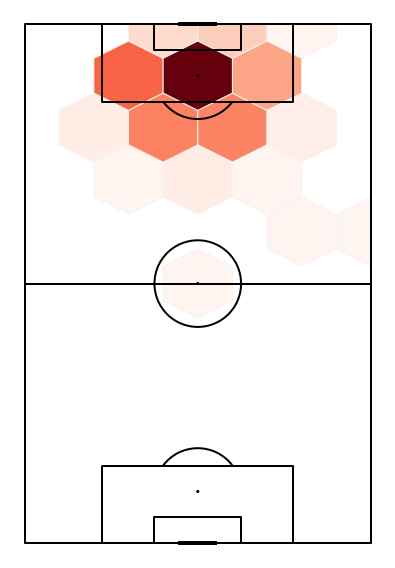

In [47]:
pitch = mplsoccer.VerticalPitch(line_color='black',line_zorder=2,pitch_color='white')
fig,ax = pitch.draw(figsize=(6,8))
hexmap = pitch.hexbin(shotData['startX'],shotData['startY'],
                      ax=ax,gridsize=(5,5),
                      edgecolor='#f4f4f4',cmap='Reds')

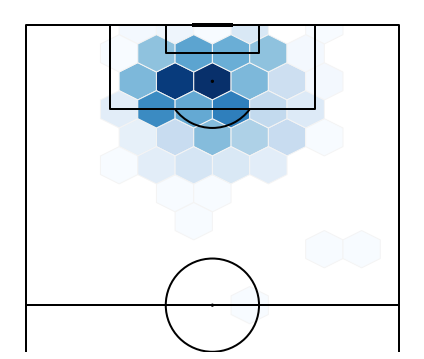

In [48]:
pitch = mplsoccer.VerticalPitch(line_color='black',line_zorder=2,pitch_color='white',half=True,
                                pad_bottom=10)
fig,ax = pitch.draw(figsize=(6,8))
hexmap = pitch.hexbin(shotData['startX'],shotData['startY'],
                      ax=ax,gridsize=(10,10),
                      edgecolor='#f4f4f4',cmap='Blues')

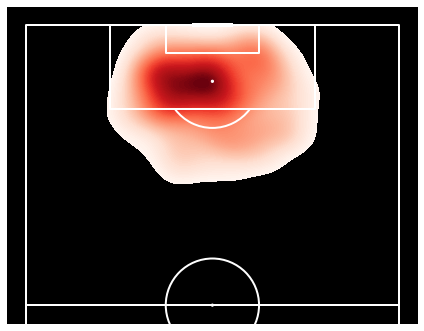

In [49]:
pitch_dark = mplsoccer.VerticalPitch(line_color='white',line_zorder=2,pitch_color='black',half=True)
fig,ax = pitch_dark.draw(figsize=(6,8))
kdeplot_dark = pitch_dark.kdeplot(shotData['startX'],shotData['startY'],
                                  ax=ax, shade=True,
                                  levels=100,cmap='Reds')

### Team-wise 

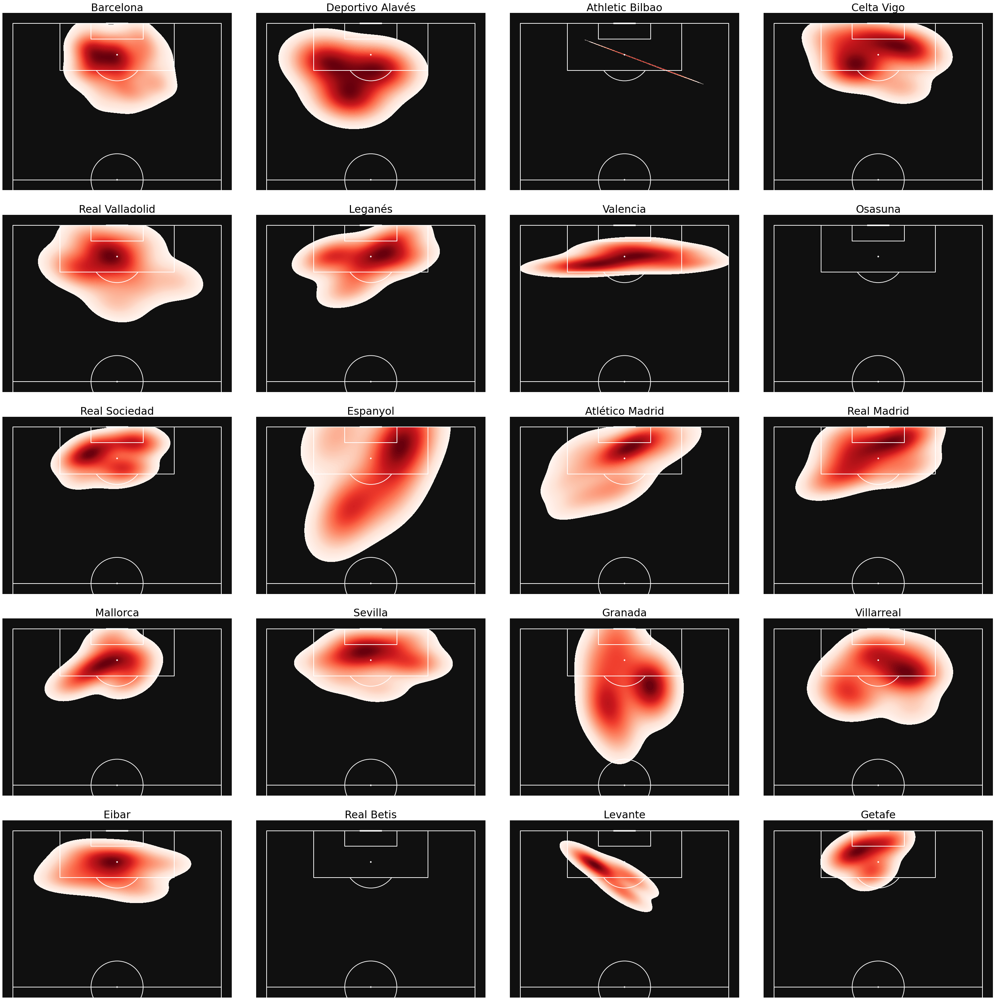

In [50]:
pitch = mplsoccer.VerticalPitch(line_color='white', line_zorder=2, pitch_color='#101010', half=True)
fig,axs = pitch.grid(nrows=5, ncols=4, space=0.1, figheight=40, 
                     title_height=0, endnote_height=0,
                     grid_height=0.98, grid_width=0.9, 
                     bottom=0.01, left =0.05)
teamIDs = shotData['possession_team.id'].unique()
for idx, ax in enumerate(axs['pitch'].flat):
    teamShotsData = shotData[shotData['possession_team.id'] == teamIDs[idx]]
    kdeplot_dark = pitch_dark.kdeplot(teamShotsData['startX'],teamShotsData['startY'],
                                      ax=ax, shade=True, levels=100, cmap='Reds')
    ax.set_title(teamShotsData['possession_team.name'].unique().item(), fontsize=30)

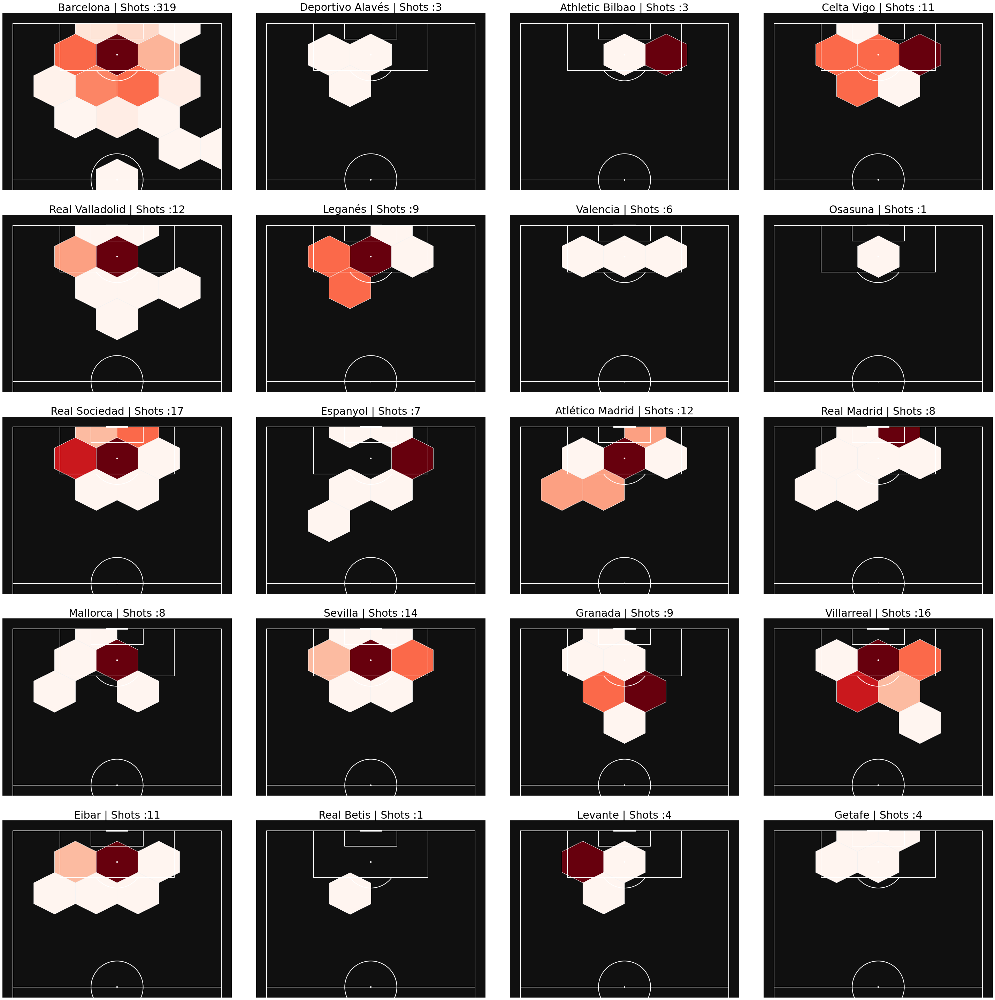

In [51]:
pitch = mplsoccer.VerticalPitch(line_color='white', line_zorder=2, pitch_color='#101010', half=True)
fig,axs = pitch.grid(nrows=5, ncols=4, space=0.1, figheight=40, 
                     title_height=0, endnote_height=0,
                     grid_height=0.98, grid_width=0.9, 
                     bottom=0.01, left =0.05)
teamIDs = shotData['possession_team.id'].unique()
for idx, ax in enumerate(axs['pitch'].flat):
    teamShotsData = shotData[shotData['possession_team.id'] == teamIDs[idx]]
    hexmap = pitch.hexbin(teamShotsData['startX'],teamShotsData['startY'],
                          ax=ax, edgecolor='#f4f4f4', gridsize=(5,5), cmap='Reds')
    ax.set_title(teamShotsData['possession_team.name'].unique().item() + " | Shots :" + str(len(teamShotsData)), fontsize=30)

### Player-Wise (Barcelona)

In [52]:
barcaEventData = shotData[shotData['team.id']==217]

In [53]:
len(barcaEventData['player.name'].unique())

10

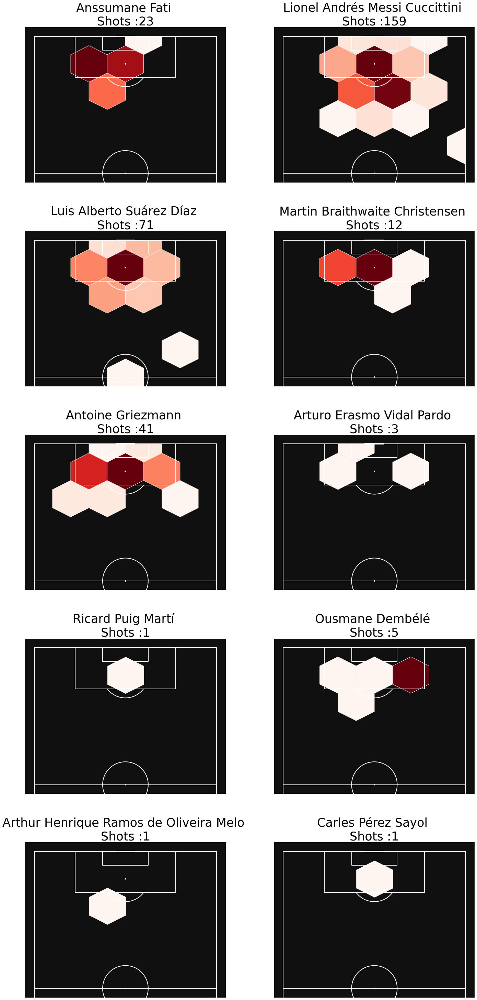

In [54]:
pitch = mplsoccer.VerticalPitch(line_color='white', line_zorder=2, pitch_color='#101010', half=True)
fig,axs = pitch.grid(nrows=5, ncols=2, space=0.2, figheight=40, 
                     title_height=0, endnote_height=0, # no title
                     grid_height=0.98, grid_width=0.9, 
                     bottom=0.01, left =0.05)
playerIDs = barcaEventData['player.id'].unique()
for idx, ax in enumerate(axs['pitch'].flat):
    if idx < len(playerIDs):
        playerShotsData = barcaEventData[barcaEventData['player.id'] == playerIDs[idx]]
        hexmap = pitch.hexbin(playerShotsData['startX'],playerShotsData['startY'],
                              ax=ax, edgecolor='#f4f4f4', gridsize=(5,5), cmap='Reds')
        ax.set_title(playerShotsData['player.name'].unique().item() + " \nShots :" + str(len(playerShotsData)), fontsize=35)

## Shot Analysis

### Team-wise

In [55]:
barcaAttData = shotData[shotData['team.id']==217]

In [56]:
shotData[['shot.outcome.id','shot.outcome.name']].drop_duplicates()

,shot.outcome.id,shot.outcome.name
471,98.0,Off T
759,99.0,Post
779,100.0,Saved
1069,97.0,Goal
1567,96.0,Blocked
3803,101.0,Wayward
33324,115.0,Saved Off Target


In [57]:
barcaAttData.groupby('player.id').agg({'player.name':'first',
                                       'team.name':'first',
                                       'type.id':'count',
                                       'shot.outcome.id':[lambda x:x.isin([97,100]).sum(),
                                                          lambda x: (x==97).sum()],
                                       'shot.statsbomb_xg':'sum'})

player.name  team.name type.id  \
                                            first      first   count   
player.id                                                              
4447.0             Martin Braithwaite Christensen  Barcelona      12   
5246.0                   Luis Alberto Suárez Díaz  Barcelona      71   
5477.0                            Ousmane Dembélé  Barcelona       5   
5487.0                          Antoine Griezmann  Barcelona      41   
5503.0             Lionel Andrés Messi Cuccittini  Barcelona     159   
8206.0                  Arturo Erasmo Vidal Pardo  Barcelona       3   
11392.0    Arthur Henrique Ramos de Oliveira Melo  Barcelona       1   
24841.0                         Ricard Puig Martí  Barcelona       1   
25006.0                        Carles Pérez Sayol  Barcelona       1   
30756.0                            Anssumane Fati  Barcelona      23   

          shot.outcome.id            shot.statsbomb_xg  
               <lambda_0> <lambda_1>               sum  
player.id                                               
4447.0                7.0        1.0          2.665911  
5246.0               38.0       13.0         12.680841  
5477.0                2.0        1.0          1.035488  
5487.0               16.0        7.0          6.814204  
5503.0               68.0       25.0         19.486048  
8206.0                2.0        1.0          0.234118  
11392.0               0.0        0.0          0.027199  
24841.0               1.0        0.0          0.059284  
25006.0               1.0        0.0          0.171200  
30756.0               8.0        5.0          2.996818

In [58]:
playerShotsData = barcaAttData.groupby('player.id').agg({'player.name':'first',
                                                        'team.name':'first',
                                                        'type.id':'count',
                                                        'shot.outcome.id':[lambda x:x.isin([97,100]).sum(),
                                                                           lambda x: (x==97).sum()],
                                                        'shot.statsbomb_xg':'sum'})

In [59]:
playerShotsData.columns = ['player.name','team.name','totShots','shotsOT','Goals','xG']

In [60]:
playerMatchMins_df = barcaAttData.drop_duplicates(subset=['player.id','match_id']).groupby(['player.id']).agg({'minsPlayed':'sum'})

In [61]:
playerMatchMins_df.shape

(10, 1)

In [62]:
playerShotsData.shape

(10, 6)

In [63]:
playerShotsData = pd.concat([playerShotsData,playerMatchMins_df], axis=1)

In [64]:
playerShotsData['shotsPer90'] = playerShotsData['shotsOT'].divide(playerShotsData['minsPlayed'])*90

In [65]:
playerShotsData['shotAccuracy'] = playerShotsData['shotsOT'].divide(playerShotsData['totShots']).multiply(100).round(1)

In [66]:
playerShotsData

,player.name,team.name,totShots,shotsOT,Goals,xG,minsPlayed,shotsPer90,shotAccuracy
player.id,,,,,,,,,
4447.0,Martin Braithwaite Christensen,Barcelona,12,7.0,1.0,2.665911,300.0,2.100000,58.3
5246.0,Luis Alberto Suárez Díaz,Barcelona,71,38.0,13.0,12.680841,1816.0,1.883260,53.5
5477.0,Ousmane Dembélé,Barcelona,5,2.0,1.0,1.035488,234.0,0.769231,40.0
5487.0,Antoine Griezmann,Barcelona,41,16.0,7.0,6.814204,1862.0,0.773362,39.0
5503.0,Lionel Andrés Messi Cuccittini,Barcelona,159,68.0,25.0,19.486048,3004.0,2.037284,42.8
8206.0,Arturo Erasmo Vidal Pardo,Barcelona,3,2.0,1.0,0.234118,185.0,0.972973,66.7
11392.0,Arthur Henrique Ramos de Oliveira Melo,Barcelona,1,0.0,0.0,0.027199,38.0,0.000000,0.0
24841.0,Ricard Puig Martí,Barcelona,1,1.0,0.0,0.059284,94.0,0.957447,100.0
25006.0,Carles Pérez Sayol,Barcelona,1,1.0,0.0,0.171200,9.0,10.000000,100.0


In [67]:
playerShotsData_Filtered = playerShotsData[playerShotsData['totShots']>=5]

In [68]:
playerShotsData_Filtered.style.bar().set_precision(1)

,player.name,team.name,totShots,shotsOT,Goals,xG,minsPlayed,shotsPer90,shotAccuracy
player.id,,,,,,,,,
4447.0,Martin Braithwaite Christensen,Barcelona,12,7.0,1.0,2.7,300.0,2.1,58.3
5246.0,Luis Alberto Suárez Díaz,Barcelona,71,38.0,13.0,12.7,1816.0,1.9,53.5
5477.0,Ousmane Dembélé,Barcelona,5,2.0,1.0,1.0,234.0,0.8,40.0
5487.0,Antoine Griezmann,Barcelona,41,16.0,7.0,6.8,1862.0,0.8,39.0
5503.0,Lionel Andrés Messi Cuccittini,Barcelona,159,68.0,25.0,19.5,3004.0,2.0,42.8
30756.0,Anssumane Fati,Barcelona,23,8.0,5.0,3.0,626.0,1.2,34.8


### Analysing Shot Maps

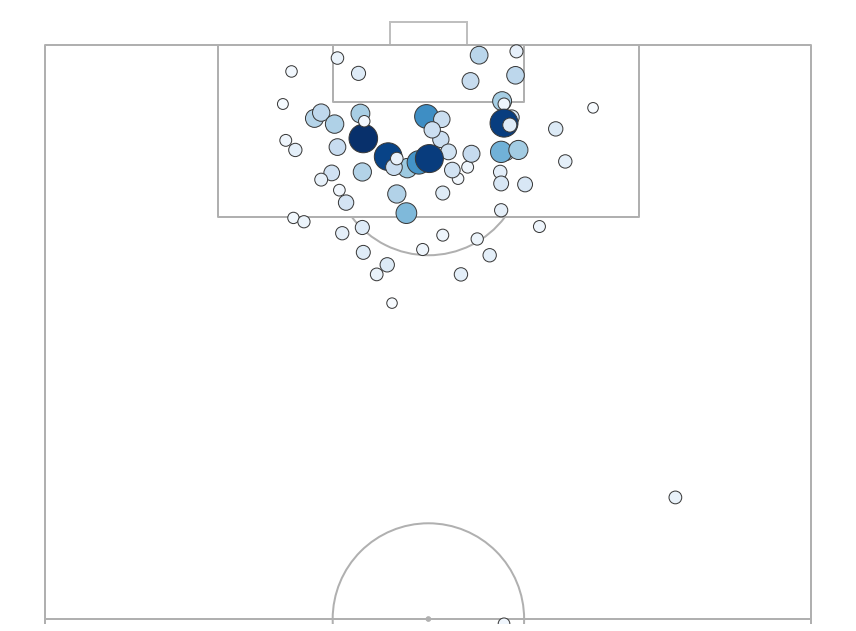

In [69]:
playerID = 5246
playerData = barcaAttData[barcaAttData['player.id'] == playerID]
pitch = mplsoccer.VerticalPitch(half=True, 
                                goal_type='box',
                                goal_alpha=0.8, 
                                pad_bottom=0.5)
fig,ax = pitch.draw(figsize=(12,10))
sc = pitch.scatter(playerData['startX'], playerData['startY'], 
                   s=(playerData['shot.statsbomb_xg']*900)+100,
                   c=playerData['shot.statsbomb_xg'].values.flatten(), 
                   edgecolors='#383838',
                   cmap='Blues',
                   marker='o',
                   ax=ax)

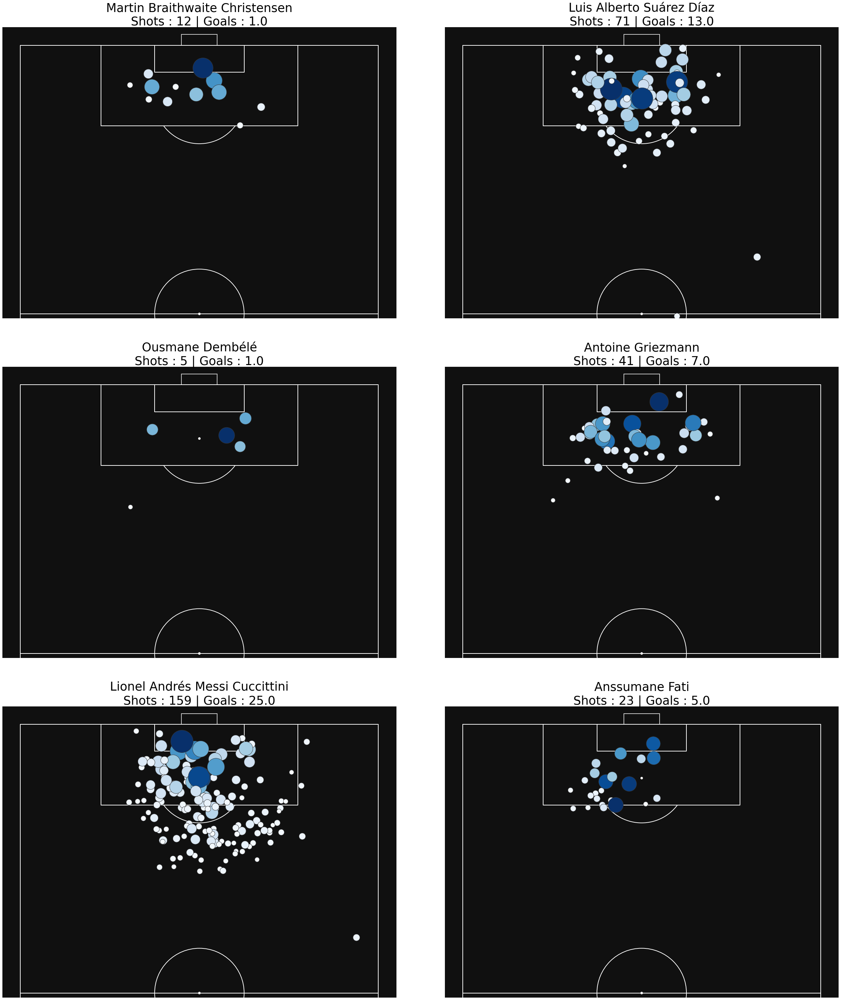

In [70]:
pitch = mplsoccer.VerticalPitch(pitch_color='#101010',line_color='white',
                                half=True, 
                                goal_type='box',
                                goal_alpha=0.8, 
                                pad_bottom=1)

fig,axs = pitch.grid(nrows=3, ncols=2, space=0.1, figheight=40,
                    title_height=0, endnote_height=0,
                    grid_width=0.9, grid_height=0.98,bottom=0.01,left=0.05)

playerIDs = playerShotsData_Filtered.index

for idx,ax in enumerate(axs['pitch'].flat):
    playerData = barcaAttData[barcaAttData['player.id'] == playerIDs[idx]]
    sc = pitch.scatter(playerData['startX'], playerData['startY'], 
                       s=(playerData['shot.statsbomb_xg']*5000)+100,
                       c=playerData['shot.statsbomb_xg'].values.flatten(), 
                       edgecolors='#383838',
                       cmap='Blues',
                       marker='o',
                       ax=ax)
    ax.set_title(playerData['player.name'].unique().item() + '\nShots : ' + str(len(playerData))
                 + ' | Goals : ' + str(playerShotsData_Filtered.loc[playerIDs[idx], 'Goals'].sum().item()), 
                 fontsize=35)

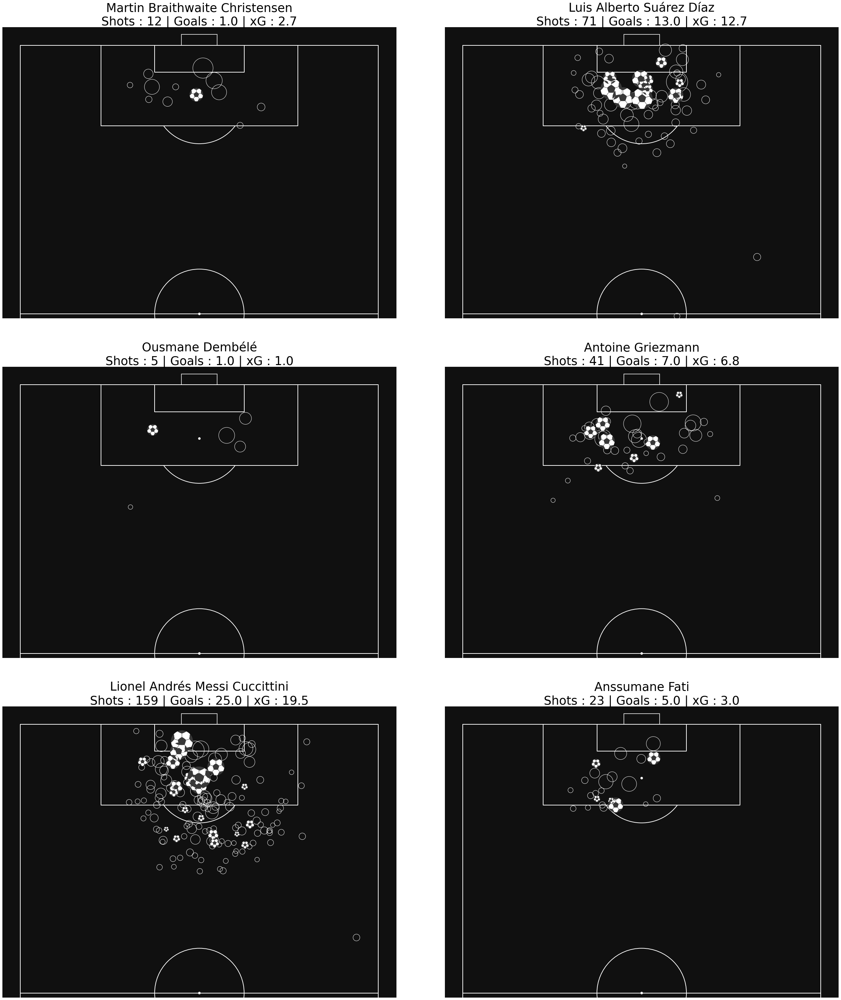

In [71]:
pitch = mplsoccer.VerticalPitch(pitch_color='#101010',line_color='white',
                                half=True, 
                                goal_type='box',
                                goal_alpha=0.8, 
                                pad_bottom=1)

fig,axs = pitch.grid(nrows=3, ncols=2, space=0.1, figheight=40,
                    title_height=0, endnote_height=0,
                    grid_width=0.9, grid_height=0.98,bottom=0.01,left=0.05)

playerIDs = playerShotsData_Filtered.index

for idx,ax in enumerate(axs['pitch'].flat):
    
    playerData = barcaAttData[barcaAttData['player.id'] == playerIDs[idx]]
    ngPlayerData = playerData[playerData['shot.outcome.id']!=97]
    gPlayerData = playerData[playerData['shot.outcome.id']==97]
    
    sc1 = pitch.scatter(ngPlayerData['startX'], ngPlayerData['startY'], 
                        s=(ngPlayerData['shot.statsbomb_xg']*5000)+100,
                        c='None', 
                        edgecolors='#ffffff',
                        marker='o',
                        ax=ax)
    sc2 = pitch.scatter(gPlayerData['startX'], gPlayerData['startY'], 
                        s=(gPlayerData['shot.statsbomb_xg']*5000)+100,
                        c='white', 
                        edgecolors='#383838',
                        marker='football', 
                        ax=ax)
    
    totGoals = playerShotsData_Filtered.loc[playerIDs[idx], 'Goals'].sum().item()
    totxG = playerShotsData_Filtered.loc[playerIDs[idx], 'xG'].sum().round(1).item()
    
    ax.set_title(playerData['player.name'].unique().item() + '\nShots : ' + str(len(playerData))
                 + ' | Goals : ' + str(totGoals) + ' | xG : ' + str(totxG), 
                 fontsize=35)

### Overperformance

In [72]:
fig = px.scatter(x='xG',y='Goals',
                 data_frame=playerShotsData,
                 text='player.name',
                 size='xG',opacity=0.8)
fig.add_trace(go.Scatter(x=[0,playerShotsData[['Goals','xG']].max().max()],
                         y=[0,playerShotsData[['Goals','xG']].max().max()]))

fig.update_traces(textposition='top center', textfont_size=10)
fig.update_layout(showlegend=True, height=600, width=1000)
fig.show()

## Carry Analysis

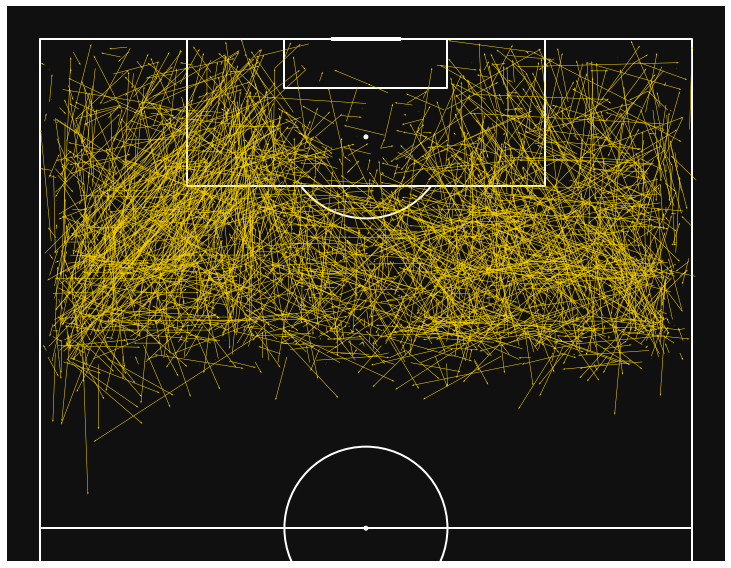

In [73]:
pitch = mplsoccer.VerticalPitch(pitch_color='#101010',line_color='white',half=True)
fig,ax = pitch.draw(figsize=(16,8))

arrows = pitch.arrows(carryData['startX'],carryData['startY'],
                      carryData['endXCarry'],carryData['endYCarry'],
                      ax=ax,
                      width=0.5,
                      color='gold')

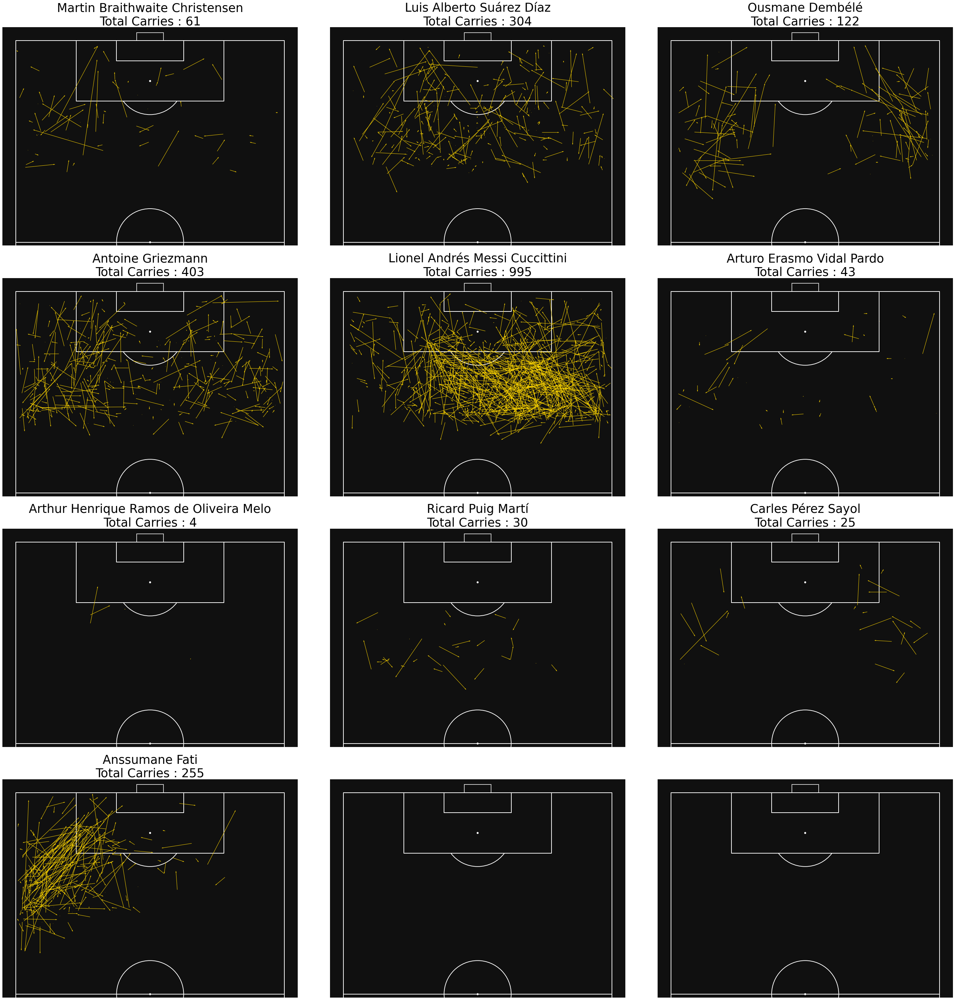

In [74]:
pitch = mplsoccer.VerticalPitch(pitch_color='#101010',line_color='white',
                                half=True, 
                                goal_type='box',
                                goal_alpha=0.8, 
                                pad_bottom=1)

fig,axs = pitch.grid(nrows=4, ncols=3, space=0.1, figheight=40,
                    title_height=0, endnote_height=0,
                    grid_width=0.9, grid_height=0.98,bottom=0.01,left=0.05)

playerIDs = playerShotsData.index

for idx,ax in enumerate(axs['pitch'].flat):
    if idx < len(playerIDs):
        playerData = carryData[carryData['player.id'] == playerIDs[idx]]
        arrows = pitch.arrows(playerData['startX'],playerData['startY'],
                              playerData['endXCarry'],playerData['endYCarry'],
                              ax=ax,
                              width=1,
                              color='gold')
        ax.set_title(playerData['player.name'].unique().item() + '\nTotal Carries : ' + str(len(playerData)),
                     fontsize=35)

## Dribble Analysis

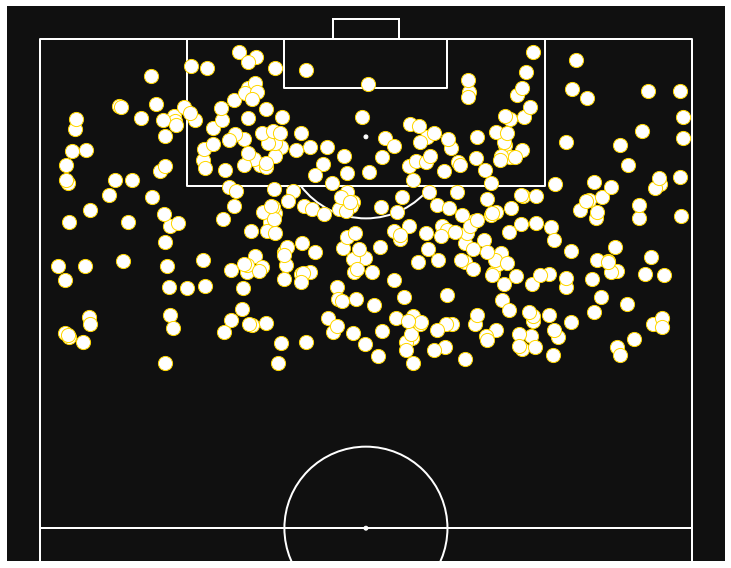

In [75]:
pitch = mplsoccer.VerticalPitch(pitch_color='#101010',line_color='white',half=True,goal_type='box')
fig,ax = pitch.draw(figsize=(16,8))

sc = pitch.scatter(dribbleData['startX'],dribbleData['startY'],
                      s=200,
                      ax=ax,
                      c='white',
                      marker='o',
                      edgecolor='gold')

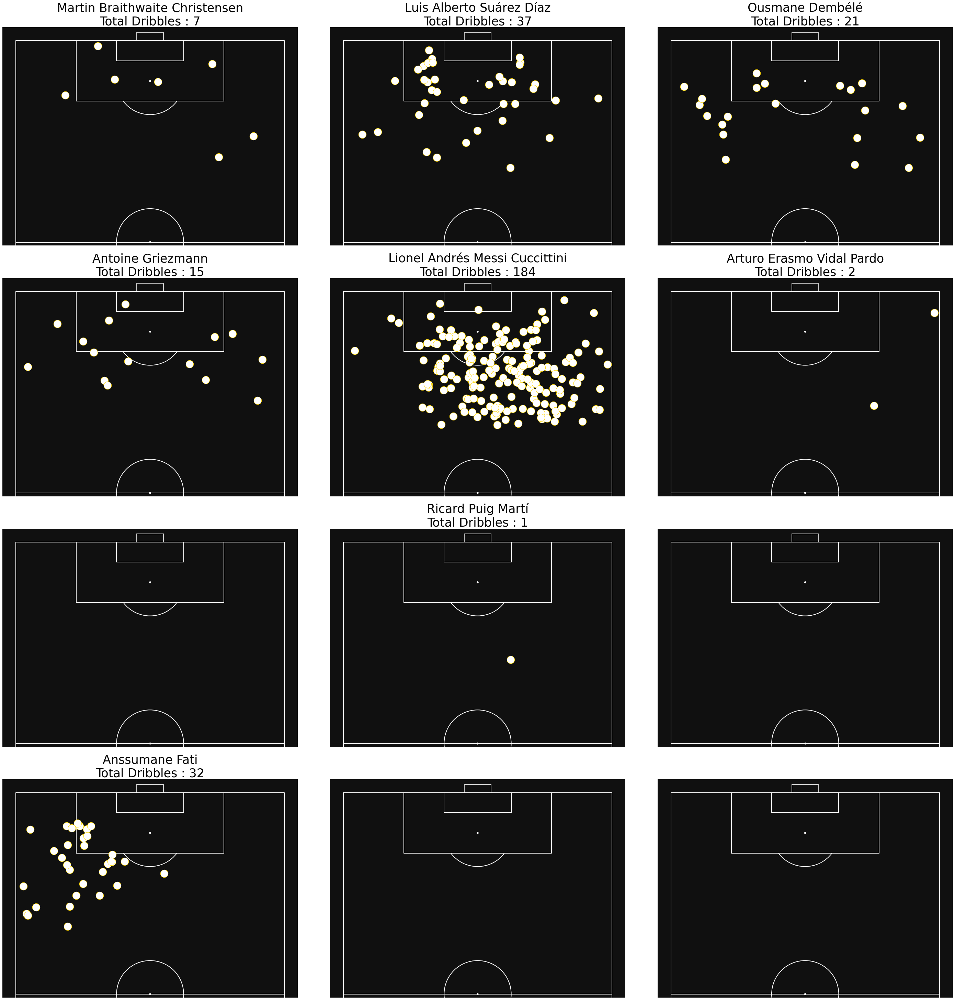

In [76]:
pitch = mplsoccer.VerticalPitch(pitch_color='#101010',line_color='white',
                                half=True, 
                                goal_type='box',
                                goal_alpha=0.8, 
                                pad_bottom=1)

fig,axs = pitch.grid(nrows=4, ncols=3, space=0.1, figheight=40,
                    title_height=0, endnote_height=0,
                    grid_width=0.9, grid_height=0.98,bottom=0.01,left=0.05)

playerIDs = playerShotsData.index

for idx,ax in enumerate(axs['pitch'].flat):
    if idx < len(playerIDs):
        playerData = dribbleData[dribbleData['player.id'] == playerIDs[idx]]
        sc = pitch.scatter(playerData['startX'],playerData['startY'],
                           ax=ax,
                           s=500,
                           color='white',
                           edgecolors='gold',
                           marker='o')
        try:
            player_name = playerData['player.name'].unique().item()
            ax.set_title(playerData['player.name'].unique().item() + '\nTotal Dribbles : ' + str(len(playerData)),
                         fontsize=35)
        except ValueError:
            pass

In [77]:
dribbleData[['dribble.outcome.id','dribble.outcome.name']].drop_duplicates()

,dribble.outcome.id,dribble.outcome.name
109,8.0,Complete
356,9.0,Incomplete


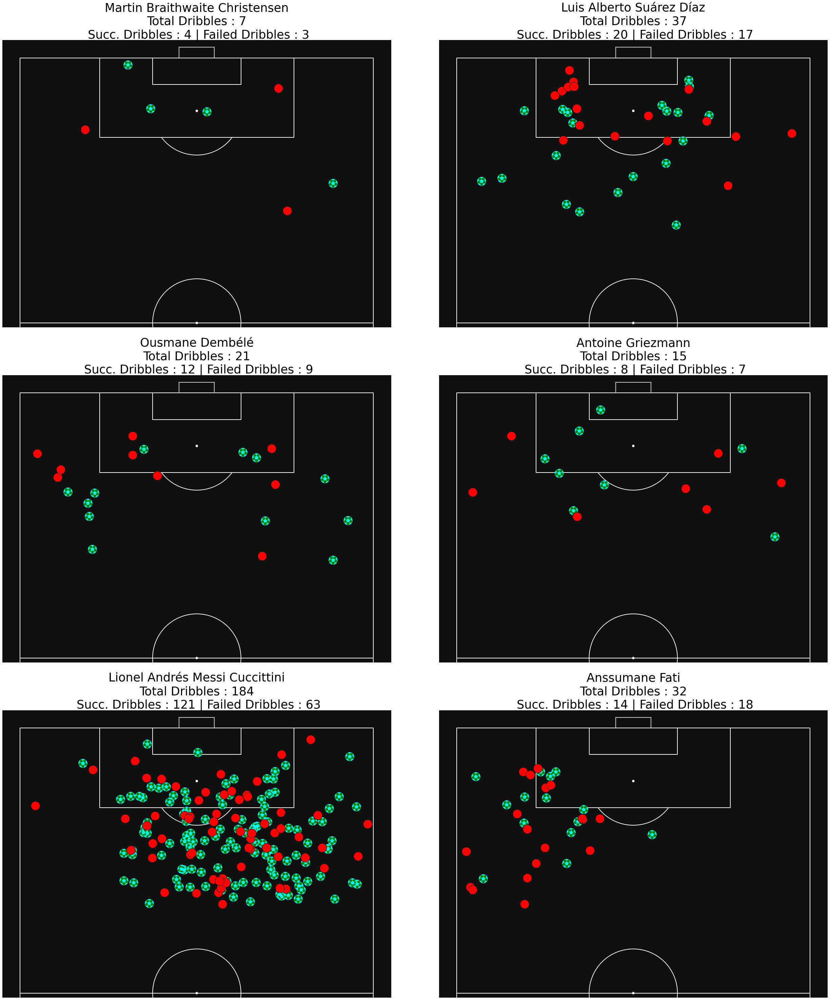

In [78]:
pitch = mplsoccer.VerticalPitch(pitch_color='#101010',line_color='white',
                                half=True, 
                                goal_type='box',
                                goal_alpha=0.8, 
                                pad_bottom=1)

fig,axs = pitch.grid(nrows=3, ncols=2, space=0.1, figheight=40,
                    title_height=0, endnote_height=0,
                    grid_width=0.9, grid_height=0.98,bottom=0.01,left=0.05)

playerIDs = playerShotsData_Filtered.index

for idx,ax in enumerate(axs['pitch'].flat):
    if idx < len(playerIDs):
        
        playerData = dribbleData[dribbleData['player.id'] == playerIDs[idx]]
        succDribbleData = playerData[playerData['dribble.outcome.id']==8]
        unsuccDribbleData = playerData[playerData['dribble.outcome.id']==9]
        
        sc1 = pitch.scatter(succDribbleData['startX'],succDribbleData['startY'],
                           ax=ax,
                           s=700,
                           c='green',
                           edgecolors='cyan',
                           marker='football')
        
        sc2 = pitch.scatter(unsuccDribbleData['startX'],unsuccDribbleData['startY'],
                           ax=ax,
                           s=700,
                           c='red',
                           edgecolors='black',
                           marker='o')
        
        ax.set_title(playerData['player.name'].unique().item() + '\nTotal Dribbles : ' + str(len(playerData))\
                     + '\n Succ. Dribbles : ' + str(len(succDribbleData)) + ' | Failed Dribbles : ' + str(len(unsuccDribbleData)) ,
                         fontsize=35)
        

#### Nutmegs

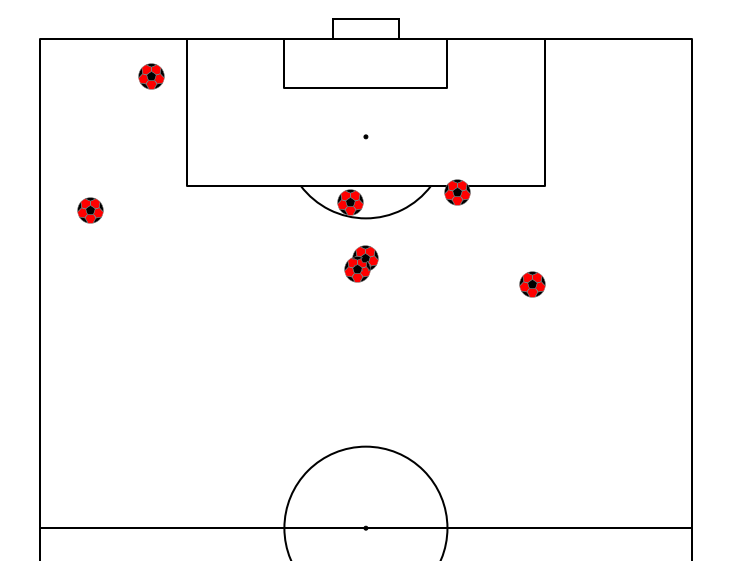

In [79]:
pitch = mplsoccer.VerticalPitch(pitch_color='white',line_color='black',half=True,goal_type='box')
fig,ax = pitch.draw(figsize=(16,8))

nutmegData = dribbleData[dribbleData['dribble.nutmeg'] == True]

sc = pitch.scatter(nutmegData['startX'],nutmegData['startY'],
                   s=700,
                   ax=ax,
                   c='red',
                   marker='football',
                   edgecolor='grey')

## Build-up Play Analysis (xG Chain & xG Build-up)

**xG Chain:** <br>
xG for possessions that lead to a shot, where the player was involved at least once in that possession, **INCLUDING** the final pass and shot.
<br>
<br>
**xG Build-up:** <br>
xG for possessions that lead to a shot, where the player was involved at least once in that possession, **EXCLUDING** the final pass and shot.

### Obtaining Possession Chains

In [80]:
eventsFwdData.groupby(['match_id','possession'])['player.name'].apply(list)

match_id  possession
303377    2             [Antoine Griezmann, Jorge Molina Vidal, Antoin...
          3                           [Anssumane Fati, Antoine Griezmann]
          4                      [Jorge Molina Vidal, Jorge Molina Vidal]
          6             [Jaime Mata Arnaiz, Jaime Mata Arnaiz, Jaime M...
          7             [Antoine Griezmann, Antoine Griezmann, Antoine...
                                              ...                        
303731    180           [Enrique González Casín, Lionel Andrés Messi C...
          181           [Enrique González Casín, Pablo Ezequiel De Bla...
          182           [Fabián Ariel Orellana Valenzuela, Martin Brai...
          183           [Enrique González Casín, Martin Braithwaite Ch...
          184           [Pablo Ezequiel De Blasis, Gonzalo Escalante, ...
Name: player.name, Length: 4657, dtype: object

### xG Chain Computation

In [81]:
xGChainData = eventsFwdData.groupby(['match_id','possession'])['player.name'].apply(list)

In [82]:
eventsFwdData.groupby(['match_id','possession'])['shot.statsbomb_xg'].sum()

match_id  possession
303377    2             0.000000
          3             0.000000
          4             0.000000
          6             0.000000
          7             0.000000
                          ...   
303731    180           0.835386
          181           0.000000
          182           0.364813
          183           0.000000
          184           0.000000
Name: shot.statsbomb_xg, Length: 4657, dtype: float64

In [83]:
eventsFwdData.groupby(['match_id','possession']).agg({'shot.outcome.id': lambda x: (x==97).sum()})

shot.outcome.id
match_id possession                 
303377   2                       0.0
         3                       0.0
         4                       0.0
         6                       0.0
         7                       0.0
...                              ...
303731   180                     1.0
         181                     0.0
         182                     0.0
         183                     0.0
         184                     0.0

[4657 rows x 1 columns]

In [84]:
xGData = eventsFwdData.groupby(['match_id','possession'])['shot.statsbomb_xg'].sum()

In [85]:
goalData = eventsFwdData.groupby(['match_id','possession']).agg({'shot.outcome.id': lambda x: (x==97).sum()})

In [86]:
pd.concat([xGChainData,xGData,goalData],axis=1)

player.name  \
match_id possession                                                      
303377   2           [Antoine Griezmann, Jorge Molina Vidal, Antoin...   
         3                         [Anssumane Fati, Antoine Griezmann]   
         4                    [Jorge Molina Vidal, Jorge Molina Vidal]   
         6           [Jaime Mata Arnaiz, Jaime Mata Arnaiz, Jaime M...   
         7           [Antoine Griezmann, Antoine Griezmann, Antoine...   
...                                                                ...   
303731   180         [Enrique González Casín, Lionel Andrés Messi C...   
         181         [Enrique González Casín, Pablo Ezequiel De Bla...   
         182         [Fabián Ariel Orellana Valenzuela, Martin Brai...   
         183         [Enrique González Casín, Martin Braithwaite Ch...   
         184         [Pablo Ezequiel De Blasis, Gonzalo Escalante, ...   

                     shot.statsbomb_xg  shot.outcome.id  
match_id possession                                      
303377   2                    0.000000              0.0  
         3                    0.000000              0.0  
         4                    0.000000              0.0  
         6                    0.000000              0.0  
         7                    0.000000              0.0  
...                                ...              ...  
303731   180                  0.835386              1.0  
         181                  0.000000              0.0  
         182                  0.364813              0.0  
         183                  0.000000              0.0  
         184                  0.000000              0.0  

[4657 rows x 3 columns]

In [87]:
xGChainData = pd.concat([xGChainData,xGData,goalData],axis=1)

In [88]:
xGChainData = deepcopy(xGChainData[xGChainData['shot.statsbomb_xg']>0])

In [89]:
xGChainData['player.name'].apply(lambda x: 'Lionel Andrés Messi Cuccittini' in x)

match_id  possession
303377    23             True
          26             True
          37            False
          47             True
          64             True
                        ...  
303731    158           False
          165           False
          168            True
          180            True
          182           False
Name: player.name, Length: 457, dtype: bool

In [90]:
condition = xGChainData['player.name'].apply(lambda x: 'Lionel Andrés Messi Cuccittini' in x)

In [91]:
xGChainData.loc[condition,'shot.statsbomb_xg'].sum()

40.846270046

In [92]:
playerNames = playerShotsData['player.name'].unique()
for player in playerNames:
    condition = xGChainData['player.name'].apply(lambda x: player in x)
    print(player, 
          xGChainData.loc[condition,'shot.statsbomb_xg'].shape[0], # No. of xG Chain involvements
          xGChainData.loc[condition,'shot.statsbomb_xg'].sum().round(1),'\n')

Martin Braithwaite Christensen 31 5.8 

Luis Alberto Suárez Díaz 144 21.3 

Ousmane Dembélé 23 2.7 

Antoine Griezmann 137 22.3 

Lionel Andrés Messi Cuccittini 279 40.8 

Arturo Erasmo Vidal Pardo 17 2.8 

Arthur Henrique Ramos de Oliveira Melo 2 0.1 

Ricard Puig Martí 6 0.3 

Carles Pérez Sayol 7 1.7 

Anssumane Fati 56 8.8 



In [93]:
for i,row in playerShotsData.iterrows():
    player = row['player.name']
    chainCondition = xGChainData['player.name'].apply(lambda x: player in x)
    playerShotsData.loc[row.name,'xGChain'] = xGChainData.loc[chainCondition,'shot.statsbomb_xg'].sum().round(1)
    playerShotsData.loc[row.name,'GChain'] = xGChainData.loc[chainCondition,'shot.outcome.id'].sum().round(1)    

In [94]:
playerShotsData

,player.name,team.name,totShots,shotsOT,Goals,xG,minsPlayed,shotsPer90,shotAccuracy,xGChain,GChain
player.id,,,,,,,,,,,
4447.0,Martin Braithwaite Christensen,Barcelona,12,7.0,1.0,2.665911,300.0,2.100000,58.3,5.8,4.0
5246.0,Luis Alberto Suárez Díaz,Barcelona,71,38.0,13.0,12.680841,1816.0,1.883260,53.5,21.3,28.0
5477.0,Ousmane Dembélé,Barcelona,5,2.0,1.0,1.035488,234.0,0.769231,40.0,2.7,3.0
5487.0,Antoine Griezmann,Barcelona,41,16.0,7.0,6.814204,1862.0,0.773362,39.0,22.3,21.0
5503.0,Lionel Andrés Messi Cuccittini,Barcelona,159,68.0,25.0,19.486048,3004.0,2.037284,42.8,40.8,47.0
8206.0,Arturo Erasmo Vidal Pardo,Barcelona,3,2.0,1.0,0.234118,185.0,0.972973,66.7,2.8,3.0
11392.0,Arthur Henrique Ramos de Oliveira Melo,Barcelona,1,0.0,0.0,0.027199,38.0,0.000000,0.0,0.1,0.0
24841.0,Ricard Puig Martí,Barcelona,1,1.0,0.0,0.059284,94.0,0.957447,100.0,0.3,0.0
25006.0,Carles Pérez Sayol,Barcelona,1,1.0,0.0,0.171200,9.0,10.000000,100.0,1.7,0.0


### xG Build-up Computation

In [95]:
xGBuildupData = eventsFwdData.groupby(['match_id','possession'])['player.name'].apply(list)
xGData = eventsFwdData.groupby(['match_id','possession'])['shot.statsbomb_xg'].sum()
goalData = eventsFwdData.groupby(['match_id','possession']).agg({'shot.outcome.id': lambda x: (x==97).sum()})

xGBuildupData = pd.concat([xGBuildupData,xGData,goalData],axis=1)
xGBuildupData = deepcopy(xGBuildupData[xGBuildupData['shot.statsbomb_xg']>0])

In [96]:
xGBuildupData['player.name'].apply(lambda x: 'Lionel Andrés Messi Cuccittini' in x[:-2])
condition = xGBuildupData['player.name'].apply(lambda x: 'Lionel Andrés Messi Cuccittini' in x[:-2])
xGBuildupData.loc[condition,'shot.statsbomb_xg'].sum()

34.487136195

In [97]:
for i,row in playerShotsData.iterrows():
    player = row['player.name']
    BuildupCondition = xGBuildupData['player.name'].apply(lambda x: player in x[:-2])
    playerShotsData.loc[row.name,'xGBuildup'] = xGBuildupData.loc[BuildupCondition,'shot.statsbomb_xg'].sum().round(1)

In [98]:
playerShotsData

,player.name,team.name,totShots,shotsOT,Goals,xG,minsPlayed,shotsPer90,shotAccuracy,xGChain,GChain,xGBuildup
player.id,,,,,,,,,,,,
4447.0,Martin Braithwaite Christensen,Barcelona,12,7.0,1.0,2.665911,300.0,2.100000,58.3,5.8,4.0,4.8
5246.0,Luis Alberto Suárez Díaz,Barcelona,71,38.0,13.0,12.680841,1816.0,1.883260,53.5,21.3,28.0,15.1
5477.0,Ousmane Dembélé,Barcelona,5,2.0,1.0,1.035488,234.0,0.769231,40.0,2.7,3.0,2.6
5487.0,Antoine Griezmann,Barcelona,41,16.0,7.0,6.814204,1862.0,0.773362,39.0,22.3,21.0,19.9
5503.0,Lionel Andrés Messi Cuccittini,Barcelona,159,68.0,25.0,19.486048,3004.0,2.037284,42.8,40.8,47.0,34.5
8206.0,Arturo Erasmo Vidal Pardo,Barcelona,3,2.0,1.0,0.234118,185.0,0.972973,66.7,2.8,3.0,2.8
11392.0,Arthur Henrique Ramos de Oliveira Melo,Barcelona,1,0.0,0.0,0.027199,38.0,0.000000,0.0,0.1,0.0,0.1
24841.0,Ricard Puig Martí,Barcelona,1,1.0,0.0,0.059284,94.0,0.957447,100.0,0.3,0.0,0.2
25006.0,Carles Pérez Sayol,Barcelona,1,1.0,0.0,0.171200,9.0,10.000000,100.0,1.7,0.0,1.7


### Analysing xG Chain & xG Build-up

In [99]:
i=j=1

fig = make_subplots(rows=1, cols=2, 
                    shared_xaxes=False, 
                    vertical_spacing=0.1, 
                    subplot_titles=['xG Chain', 'xG Build-up'])

fig.add_trace(go.Bar(x=playerShotsData['player.name'],
                     y=playerShotsData['xGChain'],
                     text=playerShotsData['xGChain'],
                     name='xG Chain'),
              row=1, col=1)

fig.add_trace(go.Bar(x=playerShotsData['player.name'],
                     y=playerShotsData['xGBuildup'],
                     text=playerShotsData['xGBuildup'],
                     name='xG Build-up'),
              row=1, col=2)
fig.update_traces(textposition='inside',textfont_size=30,textfont_color='white')
fig.update_layout(height=600)

fig.show()

In [100]:
fig = px.scatter(x='xGChain',y='xGBuildup',data_frame=playerShotsData,
                 text='player.name',opacity=0.8)

fig.add_trace(go.Scatter(x=playerShotsData['xGChain'],
                         y=[playerShotsData['xGBuildup'].mean()]*len(playerShotsData),
                         name='Avg. xG Build-up',marker={'size':.1}))

fig.add_trace(go.Scatter(x=[playerShotsData['xGChain'].mean()]*len(playerShotsData),
                         y=playerShotsData['xGBuildup'],
                         name='Avg. xG Chain',marker={'size':.1}))

fig.update_traces(textposition='top center',textfont_size=10,marker=dict(size=10))
fig.update_layout(showlegend=True, height=600, width=1200)

fig.show()